## Importing the necessary Libraries

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from functools import reduce
from datetime import datetime, date
import plotly.express as px
import math
import seaborn as sns

## Reading the Dataset

In [12]:
## Importing the Aviation dataset 
AmericanAirlines = pd.read_csv('AAL.csv',parse_dates=True, index_col='Date',dayfirst=True)
SouthwestAirlines = pd.read_csv('LUV.csv',parse_dates=True, index_col='Date',dayfirst=True)
Allegiant = pd.read_csv('ALGT.csv',parse_dates=True, index_col='Date',dayfirst=True)
Allegiant = pd.read_csv('ALGT.csv',parse_dates=True, index_col='Date',dayfirst=True)
DeltaAirlines = pd.read_csv('DAL.csv', parse_dates=True, index_col='Date',dayfirst=True)
AlaskaAirgroup = pd.read_csv('ALK.csv',parse_dates=True, index_col='Date',dayfirst=True)
HawaiianHoldings = pd.read_csv('HA.csv', parse_dates=True, index_col='Date',dayfirst=True)

## Importing the Finance Dataset
Barclays = pd.read_csv('BCS.csv', parse_dates=['Date'], index_col='Date',dayfirst=True)
CreditSuisse = pd.read_csv('CS.csv',parse_dates=True, index_col='Date',dayfirst=True)
DeutscheBank = pd.read_csv('DB.csv', parse_dates=True, index_col='Date',dayfirst=True)
GoldmanSachs = pd.read_csv('GS.csv',parse_dates=True, index_col='Date',dayfirst=True)
WellsFargo = pd.read_csv('WFC.csv', parse_dates=True, index_col='Date',dayfirst=True)
MorganStanley = pd.read_csv('MS.csv',parse_dates=True, index_col='Date',dayfirst=True)

## Importing the Technology Dataset
IBM = pd.read_csv('IBM.csv',parse_dates=True, index_col='Date',dayfirst=True)
Facebook = pd.read_csv('FB.csv',parse_dates=True, index_col='Date',dayfirst=True)
Google = pd.read_csv('GOOG.csv', parse_dates=True, index_col='Date',dayfirst=True)
Amazon = pd.read_csv('AMZN.csv',parse_dates=True, index_col='Date',dayfirst=True)
Apple = pd.read_csv('AAPL.csv', parse_dates=True, index_col='Date',dayfirst=True)
Microsoft = pd.read_csv('MSFT.csv', parse_dates=True, index_col='Date',dayfirst=True)

## Importing the Pharmaceuticals Dataset
MerckCO = pd.read_csv('MRK.csv', parse_dates=True, index_col='Date',dayfirst=True)
Pfizer = pd.read_csv('PFE.csv',parse_dates=True, index_col='Date',dayfirst=True)
RocheHolding = pd.read_csv('RHHBY.csv', parse_dates=True, index_col='Date',dayfirst=True)
UnitedHealthGroup = pd.read_csv('UNH.csv',parse_dates=True, index_col='Date',dayfirst=True)
JohnsonJ = pd.read_csv('JNJ.csv', parse_dates=True, index_col='Date',dayfirst=True)
BauschHealth = pd.read_csv('BHC.csv', parse_dates=True, index_col='Date',dayfirst=True)

SP500 = pd.read_csv('S&P500.csv', parse_dates=True, index_col='Date',dayfirst=True)

## Sectorwise Comparison of stocks

### Aviation Sector

In [13]:
Aviation = [AmericanAirlines['Close'], SouthwestAirlines['Close'],Allegiant['Close'] , DeltaAirlines['Close'], AlaskaAirgroup['Close'], HawaiianHoldings['Close'], SP500['Close']]
prices = reduce(lambda  left,right: pd.merge(left,right,on=['Date'],how='outer'), Aviation)
date_sorted = prices.sort_values(by='Date',ascending=True)
Av_prices = date_sorted.loc['20151001':'20201001']
Av_prices.columns = ['AmericanAirlines','SouthwestAirlines','Allegiant','DeltaAirlines','AlaskaAirgroup','HawaiianHoldings','SP500']
Av_prices.dropna(inplace=True)

In [14]:
Av_prices.head()

,AmericanAirlines,SouthwestAirlines,Allegiant,DeltaAirlines,AlaskaAirgroup,HawaiianHoldings,SP500
Date,,,,,,,
2015-10-01,39.200001,38.410000,217.979996,45.410000,80.230003,24.730000,1923.819946
2015-10-02,38.630001,38.380001,215.589996,44.869999,79.260002,24.280001,1951.359985
2015-10-05,40.189999,39.299999,216.059998,46.959999,80.910004,25.500000,1987.050049
2015-10-06,38.130001,38.000000,208.600006,45.090000,74.529999,24.250000,1979.920044
2015-10-07,39.310001,38.709999,213.839996,45.990002,75.970001,24.559999,1995.829956


### Comparing Aviation sector stocks with S&P500 index

In [15]:
fig = px.line(Av_prices, x=Av_prices.index ,y=['AmericanAirlines','SouthwestAirlines','Allegiant','DeltaAirlines','AlaskaAirgroup','HawaiianHoldings','SP500'])
fig.show()

The Aviation sector stocks did not prform well compared to the S&P500 index. They have been on a decline

### Trend of Normalized Stocks of the Aviation Industry

In [16]:
Av_prices.iloc[0]

AmericanAirlines       39.200001
SouthwestAirlines      38.410000
Allegiant             217.979996
DeltaAirlines          45.410000
AlaskaAirgroup         80.230003
HawaiianHoldings       24.730000
SP500                1923.819946
Name: 2015-10-01 00:00:00, dtype: float64

In [17]:
Av_normalized = Av_prices.div(Av_prices.iloc[0])
Av_normalized.head()

,AmericanAirlines,SouthwestAirlines,Allegiant,DeltaAirlines,AlaskaAirgroup,HawaiianHoldings,SP500
Date,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,0.985459,0.999219,0.989036,0.988108,0.987910,0.981804,1.014315
2015-10-05,1.025255,1.023171,0.991192,1.034133,1.008476,1.031136,1.032867
2015-10-06,0.972704,0.989326,0.956969,0.992953,0.928954,0.980590,1.029161
2015-10-07,1.002806,1.007810,0.981007,1.012773,0.946903,0.993126,1.037431


In [18]:
fig = px.line(Av_normalized, x=Av_normalized.index ,y=['AmericanAirlines','SouthwestAirlines','Allegiant','DeltaAirlines','AlaskaAirgroup','HawaiianHoldings','SP500'])
fig.show()

Normalized stock show how they stock has performed compared to 1st october 2015. 
- The graph shows that Hawaiian Holdings has been on a decline. 
- S&P500 index has been on an increase. 
- All the stocks have faced a sharp fall during March 2020 due to the pandemic

### Strength Relative to S&P500 for each stock from the Aviation Industry

In [19]:
Av_SP500 = Av_prices.loc [:, ['AmericanAirlines','SouthwestAirlines','Allegiant','DeltaAirlines','AlaskaAirgroup','HawaiianHoldings']].apply(lambda x: x/Av_prices['SP500'])
Av_SP500.head()
#Av_prices.loc [:, ['AmericanAirlines','SouthwestAirlines','Allegiant','DeltaAirlines','AlaskaAirgroup','HawaiianHoldings']]

,AmericanAirlines,SouthwestAirlines,Allegiant,DeltaAirlines,AlaskaAirgroup,HawaiianHoldings
Date,,,,,,
2015-10-01,0.020376,0.019965,0.113306,0.023604,0.041703,0.012855
2015-10-02,0.019796,0.019668,0.110482,0.022994,0.040618,0.012443
2015-10-05,0.020226,0.019778,0.108734,0.023633,0.040719,0.012833
2015-10-06,0.019258,0.019193,0.105358,0.022774,0.037643,0.012248
2015-10-07,0.019696,0.019395,0.107143,0.023043,0.038064,0.012306


In [20]:
fig = px.line(Av_SP500, x=Av_SP500.index ,y=['AmericanAirlines','SouthwestAirlines','Allegiant','DeltaAirlines','AlaskaAirgroup','HawaiianHoldings'])
fig.show()

This graph shows that all stocks in aviation have been on decline despite the SP index being on the rise. This shows that this entire industry has faced huge Losses.

### Calculating the daily returns from the Aviation Industry

In [21]:
returns = Av_prices.pct_change(1)

# Dropping the rows with missing values
returns = returns.dropna(axis=0)
returns.head()

,AmericanAirlines,SouthwestAirlines,Allegiant,DeltaAirlines,AlaskaAirgroup,HawaiianHoldings,SP500
Date,,,,,,,
2015-10-02,-0.014541,-0.000781,-0.010964,-0.011892,-0.012090,-0.018196,0.014315
2015-10-05,0.040383,0.023971,0.002180,0.046579,0.020818,0.050247,0.018290
2015-10-06,-0.051256,-0.033079,-0.034527,-0.039821,-0.078853,-0.049020,-0.003588
2015-10-07,0.030947,0.018684,0.025120,0.019960,0.019321,0.012783,0.008036
2015-10-08,0.010939,0.001292,-0.005518,-0.000652,-0.002764,0.062296,0.008818


<AxesSubplot:xlabel='Date'>

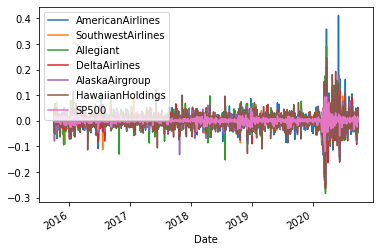

In [22]:
# Plotting the series to understand the correlation
returns.plot()

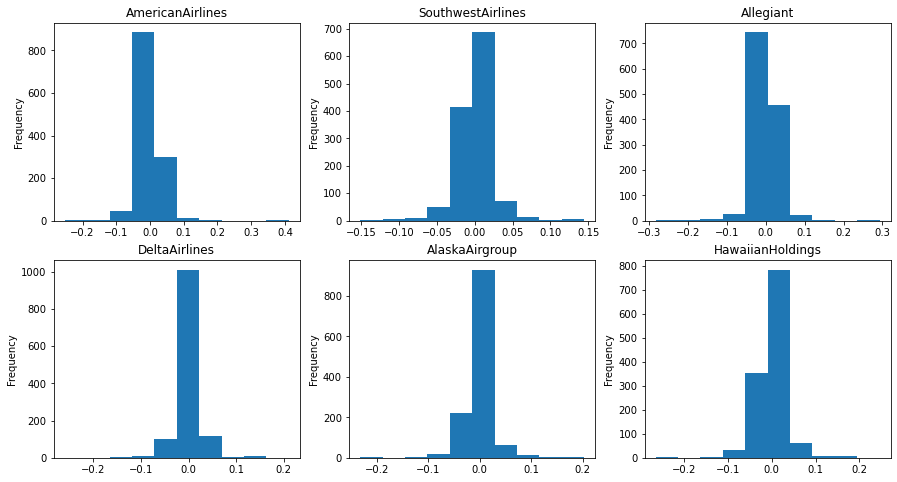

In [23]:
plt.figure(figsize=[15,8])
plt.subplot(2,3,1)
returns['AmericanAirlines'].plot.hist()
plt.title('AmericanAirlines')

plt.subplot(2,3,2)
returns['SouthwestAirlines'].plot.hist()
plt.title('SouthwestAirlines')

plt.subplot(2,3,3)
returns['Allegiant'].plot.hist()
plt.title('Allegiant')

plt.subplot(2,3,4)
returns['DeltaAirlines'].plot.hist()
plt.title('DeltaAirlines')

plt.subplot(2,3,5)
returns['AlaskaAirgroup'].plot.hist()
plt.title('AlaskaAirgroup')

plt.subplot(2,3,6)
returns['HawaiianHoldings'].plot.hist()
plt.title('HawaiianHoldings')
plt.show()

Plotting the histogram of the returns value for each company shows how much it has deviated from the mean value, which in turn shows its volatility. From the figure above, it is evident that Southwest Airlines has been the most volatile.

### Average daily return from each stock from the Aviation Industry

In [24]:
daily_returns_mean = returns.mean()
print(daily_returns_mean)

AmericanAirlines    -0.000336
SouthwestAirlines    0.000245
Allegiant           -0.000047
DeltaAirlines        0.000042
AlaskaAirgroup      -0.000256
HawaiianHoldings     0.000034
SP500                0.000517
dtype: float64


In [25]:
## Average Daily Reeturns in percentage 
daily_returns_perc = returns.mean()*100
print(daily_returns_perc)

AmericanAirlines    -0.033611
SouthwestAirlines    0.024460
Allegiant           -0.004708
DeltaAirlines        0.004181
AlaskaAirgroup      -0.025574
HawaiianHoldings     0.003424
SP500                0.051749
dtype: float64


## Correlation betwene returns of stocks

<AxesSubplot:>

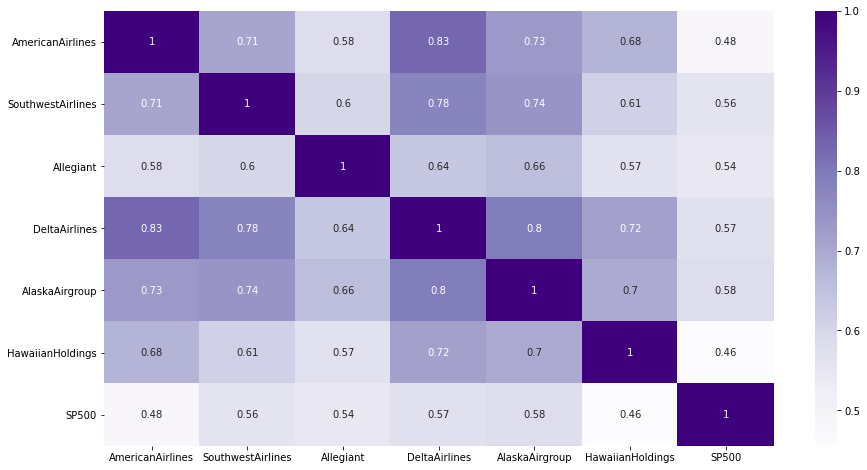

In [26]:
plt.figure(figsize=[15,8])
returns_corr = returns.corr()
sns.heatmap(returns_corr,annot=True,cmap='Purples')

There is a high correlation between the returns of American Airlines and Delta Airlines. . It also shows least correlation between HawaiianHoldings and S&P500 index.

### Cumulative Return after 5 years if investor bought the stocks on 1st October 2015

In [27]:
new = returns.loc["2015-10-01":"2020-10-01", :]

# Cumulative return from the portfolio
cumulative_returns = (1+new).cumprod()
cumulative_returns.tail(5)

,AmericanAirlines,SouthwestAirlines,Allegiant,DeltaAirlines,AlaskaAirgroup,HawaiianHoldings,SP500
Date,,,,,,,
2020-09-24,0.300255,0.959646,0.557391,0.638846,0.444971,0.501415,1.687575
2020-09-25,0.313520,0.965894,0.567759,0.655803,0.457435,0.517590,1.714537
2020-09-28,0.325510,0.995574,0.583127,0.690156,0.467905,0.541043,1.742159
2020-09-29,0.312500,0.979172,0.555510,0.674081,0.457061,0.520016,1.733775
2020-09-30,0.313520,0.976308,0.549592,0.673420,0.456562,0.521229,1.748085


### Risk of each stock from the Aviation Industry

In [28]:
stock_risk = returns.std()
print(stock_risk)

AmericanAirlines     0.034725
SouthwestAirlines    0.022913
Allegiant            0.029101
DeltaAirlines        0.026478
AlaskaAirgroup       0.026907
HawaiianHoldings     0.033132
SP500                0.012080
dtype: float64


### Minimum and maximum of each stock

In [29]:
print(Av_prices.min())

print(Av_prices.max())

print(Av_prices.count())

AmericanAirlines        9.040000
SouthwestAirlines      23.870001
Allegiant              66.230003
DeltaAirlines          19.190001
AlaskaAirgroup         23.559999
HawaiianHoldings        8.630000
SP500                1829.079956
dtype: float64
AmericanAirlines       58.470001
SouthwestAirlines      66.290001
Allegiant             227.860001
DeltaAirlines          63.160000
AlaskaAirgroup        100.239998
HawaiianHoldings       60.299999
SP500                3580.840088
dtype: float64
AmericanAirlines     1259
SouthwestAirlines    1259
Allegiant            1259
DeltaAirlines        1259
AlaskaAirgroup       1259
HawaiianHoldings     1259
SP500                1259
dtype: int64


This shows Allegiant has had a huge difference between its high and low values

## Finance Sector

In [30]:
Finance = [Barclays['Close'], CreditSuisse['Close'],DeutscheBank['Close'] , GoldmanSachs['Close'], WellsFargo['Close'], MorganStanley['Close'], SP500['Close']]
prices = reduce(lambda  left,right: pd.merge(left,right,on=['Date'],how='outer'), Finance)
date_sorted = prices.sort_values(by='Date',ascending=True)
F_prices = date_sorted.loc['20151001':'20201001']
F_prices.columns = ['Barclays','CreditSuisse','DeutscheBank','GoldmanSachs','WellsFargo','MorganStanley','SP500']
F_prices.dropna(inplace=True)

In [31]:
F_prices.head()

,Barclays,CreditSuisse,DeutscheBank,GoldmanSachs,WellsFargo,MorganStanley,SP500
Date,,,,,,,
2015-10-01,15.01,24.090000,26.520000,176.020004,51.439999,31.500000,1923.819946
2015-10-02,15.39,24.639999,27.139999,177.009995,51.259998,31.430000,1951.359985
2015-10-05,15.60,25.160000,28.200001,180.699997,52.410000,32.290001,1987.050049
2015-10-06,15.55,25.379999,28.400000,180.320007,52.029999,32.360001,1979.920044
2015-10-07,15.73,25.320000,28.790001,182.229996,52.189999,32.930000,1995.829956


### Comparing Finance stocks with S&P500 index

In [32]:
fig = px.line(F_prices, x=F_prices.index ,y=['Barclays','CreditSuisse','DeutscheBank','GoldmanSachs','WellsFargo','MorganStanley','SP500'])
fig.show()

Most of these stocks show a sideways trend

### Trend of Normalized Stocks in Finance sector

In [33]:
F_prices.iloc[0]

Barclays           15.010000
CreditSuisse       24.090000
DeutscheBank       26.520000
GoldmanSachs      176.020004
WellsFargo         51.439999
MorganStanley      31.500000
SP500            1923.819946
Name: 2015-10-01 00:00:00, dtype: float64

In [34]:
F_normalized = F_prices.div(F_prices.iloc[0])
F_normalized.head()

,Barclays,CreditSuisse,DeutscheBank,GoldmanSachs,WellsFargo,MorganStanley,SP500
Date,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.025316,1.022831,1.023379,1.005624,0.996501,0.997778,1.014315
2015-10-05,1.039307,1.044417,1.063348,1.026588,1.018857,1.025079,1.032867
2015-10-06,1.035976,1.053549,1.070890,1.024429,1.011470,1.027302,1.029161
2015-10-07,1.047968,1.051059,1.085596,1.035280,1.014580,1.045397,1.037431


In [35]:
fig = px.line(F_normalized, x=F_normalized.index ,y=['Barclays','CreditSuisse','DeutscheBank','GoldmanSachs','WellsFargo','MorganStanley','SP500'])
fig.show()

Morgan stanley and Goldman Sachs have shown slight rise in their stock 

### Strength Relative to S&P500 for Stocks from finance Sector

In [36]:
F_SP500 = F_prices.loc [:, ['Barclays','CreditSuisse','DeutscheBank','GoldmanSachs','WellsFargo','MorganStanley']].apply(lambda x: x/F_prices['SP500'])
F_SP500.head()
#Av_prices.loc [:, ['AmericanAirlines','SouthwestAirlines','Allegiant','DeltaAirlines','AlaskaAirgroup','HawaiianHoldings']]

,Barclays,CreditSuisse,DeutscheBank,GoldmanSachs,WellsFargo,MorganStanley
Date,,,,,,
2015-10-01,0.007802,0.012522,0.013785,0.091495,0.026738,0.016374
2015-10-02,0.007887,0.012627,0.013908,0.090711,0.026269,0.016107
2015-10-05,0.007851,0.012662,0.014192,0.090939,0.026376,0.016250
2015-10-06,0.007854,0.012819,0.014344,0.091074,0.026279,0.016344
2015-10-07,0.007881,0.012686,0.014425,0.091305,0.026150,0.016499


In [37]:
fig = px.line(F_SP500, x=F_SP500.index ,y=['Barclays','CreditSuisse','DeutscheBank','GoldmanSachs','WellsFargo','MorganStanley'])
fig.show()

Goldman Sach has been opposite to S&P500 as it shows a decline in the graph above.
Morgan stanley has a trend similar to S&P500 index

### Calculating the daily returns for finance stocks

In [38]:
returns = F_prices.pct_change(1)

# Dropping the rows with missing values
returns = returns.dropna(axis=0)
returns.head()

,Barclays,CreditSuisse,DeutscheBank,GoldmanSachs,WellsFargo,MorganStanley,SP500
Date,,,,,,,
2015-10-02,0.025316,0.022831,0.023379,0.005624,-0.003499,-0.002222,0.014315
2015-10-05,0.013645,0.021104,0.039057,0.020846,0.022435,0.027362,0.018290
2015-10-06,-0.003205,0.008744,0.007092,-0.002103,-0.007251,0.002168,-0.003588
2015-10-07,0.011576,-0.002364,0.013732,0.010592,0.003075,0.017614,0.008036
2015-10-08,0.005086,-0.031201,-0.013894,-0.006366,0.006706,0.001822,0.008818


<AxesSubplot:xlabel='Date'>

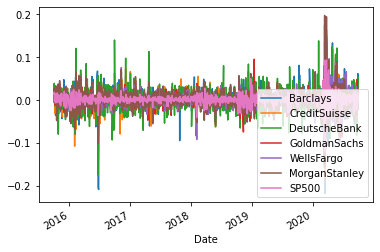

In [39]:
# Plotting the series to understand the correlation
returns.plot()

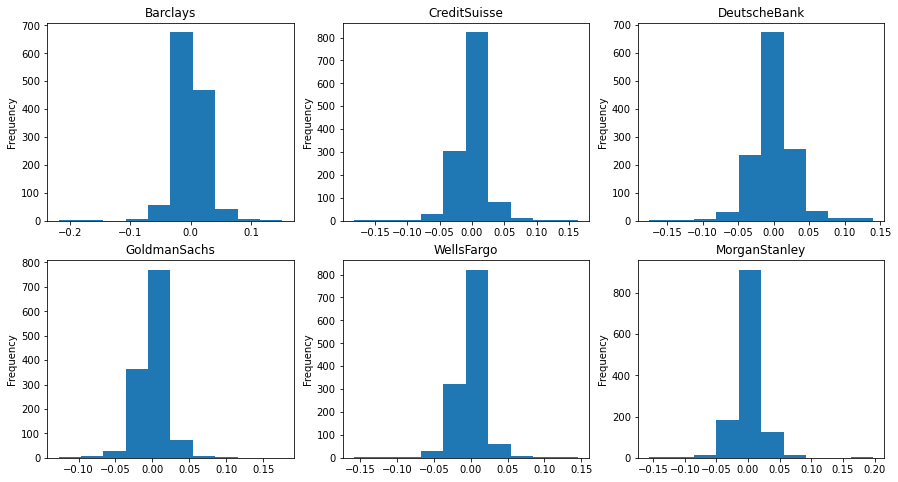

In [40]:
plt.figure(figsize=[15,8])
plt.subplot(2,3,1)
returns['Barclays'].plot.hist()
plt.title('Barclays')

plt.subplot(2,3,2)
returns['CreditSuisse'].plot.hist()
plt.title('CreditSuisse')

plt.subplot(2,3,3)
returns['DeutscheBank'].plot.hist()
plt.title('DeutscheBank')

plt.subplot(2,3,4)
returns['GoldmanSachs'].plot.hist()
plt.title('GoldmanSachs')

plt.subplot(2,3,5)
returns['WellsFargo'].plot.hist()
plt.title('WellsFargo')

plt.subplot(2,3,6)
returns['MorganStanley'].plot.hist()
plt.title('MorganStanley')
plt.show()

Deutsche Bank has a comparitively higher deviation from the mean

### Average daily return from each stock from Finance Sector

In [41]:
daily_returns_mean = returns.mean()
print(daily_returns_mean)

Barclays        -0.000548
CreditSuisse    -0.000437
DeutscheBank    -0.000529
GoldmanSachs     0.000303
WellsFargo      -0.000414
MorganStanley    0.000578
SP500            0.000517
dtype: float64


In [42]:
## Average Daily Reeturns in percentage 
daily_returns_perc = returns.mean()*100
print(daily_returns_perc)

Barclays        -0.054837
CreditSuisse    -0.043672
DeutscheBank    -0.052886
GoldmanSachs     0.030334
WellsFargo      -0.041431
MorganStanley    0.057752
SP500            0.051749
dtype: float64


### Cumulative Return for an investor if he/she bought the stocks on 1st October 2015

In [43]:
new = returns.loc["2015-10-01":"2020-10-01", :]

# Cumulative return from the portfolio
cumulative_returns = (1+new).cumprod()
cumulative_returns.tail(5)

,Barclays,CreditSuisse,DeutscheBank,GoldmanSachs,WellsFargo,MorganStanley,SP500
Date,,,,,,,
2020-09-24,0.316456,0.399336,0.305807,1.108454,0.453344,1.479683,1.687575
2020-09-25,0.313125,0.393524,0.301659,1.107545,0.459565,1.493333,1.714537
2020-09-28,0.332445,0.410959,0.317873,1.130951,0.463064,1.535873,1.742159
2020-09-29,0.330446,0.408053,0.311840,1.117998,0.452177,1.499683,1.733775
2020-09-30,0.333777,0.413865,0.316742,1.141745,0.457037,1.534921,1.748085


### Risk of each stock

In [44]:
stock_risk = returns.std()
print(stock_risk)

Barclays         0.025119
CreditSuisse     0.022842
DeutscheBank     0.027743
GoldmanSachs     0.019899
WellsFargo       0.020349
MorganStanley    0.021810
SP500            0.012080
dtype: float64


DeutscheBank shows the highest Risk

### Minimum and maximum of each stock

In [45]:
F_prices.min()

Barclays            3.840000
CreditSuisse        6.670000
DeutscheBank        5.480000
GoldmanSachs      134.970001
WellsFargo         22.530001
MorganStanley      21.690001
SP500            1829.079956
dtype: float64

In [46]:
F_prices.max()

Barclays           15.810000
CreditSuisse       25.959999
DeutscheBank       30.750000
GoldmanSachs      273.380005
WellsFargo         65.930000
MorganStanley      58.910000
SP500            3580.840088
dtype: float64

In [47]:
F_prices.count()

Barclays         1259
CreditSuisse     1259
DeutscheBank     1259
GoldmanSachs     1259
WellsFargo       1259
MorganStanley    1259
SP500            1259
dtype: int64

## Technology Sector

In [48]:
Technology = [IBM['Close'], Facebook['Close'],Google['Close'] , Amazon['Close'], Apple['Close'], Microsoft['Close'], SP500['Close']]
prices = reduce(lambda  left,right: pd.merge(left,right,on=['Date'],how='outer'), Technology)
date_sorted = prices.sort_values(by='Date',ascending=True)
T_prices = date_sorted.loc['20151001':'20201001']
T_prices.columns = ['IBM','Facebook','Google','Amazon','Apple','Microsoft','SP500']
T_prices.dropna(inplace=True)

In [49]:
T_prices.head()

,IBM,Facebook,Google,Amazon,Apple,Microsoft,SP500
Date,,,,,,,
2015-10-01,143.589996,90.949997,611.289978,520.719971,27.395000,44.610001,1923.819946
2015-10-02,144.580002,92.070000,626.909973,532.539978,27.594999,45.570000,1951.359985
2015-10-05,149.039993,94.010002,641.469971,543.679993,27.695000,46.630001,1987.050049
2015-10-06,148.779999,92.800003,645.440002,537.479980,27.827499,46.750000,1979.920044
2015-10-07,150.089996,92.400002,642.359985,541.940002,27.695000,46.799999,1995.829956


### Comparing Technology Sector stocks with S&P500 index

In [50]:
fig = px.line(T_prices, x=T_prices.index ,y=['IBM','Facebook','Google','Amazon','Apple','Microsoft','SP500'])
fig.show()

- Google and Amazon have a upward trend similar to S&P500 index. 
- This sector has performed better relative to other sectors. 
- There is a slight drop in the stock prices during March 2020 due to the pandemic, but the sector quickly recovered after that.
- Amazon performed much better after the drop in march 2020.

### Trend of Normalized Stocks for Technology Sector

In [51]:
T_prices.iloc[0]

IBM           143.589996
Facebook       90.949997
Google        611.289978
Amazon        520.719971
Apple          27.395000
Microsoft      44.610001
SP500        1923.819946
Name: 2015-10-01 00:00:00, dtype: float64

In [52]:
T_normalized = T_prices.div(T_prices.iloc[0])
T_normalized.head()

,IBM,Facebook,Google,Amazon,Apple,Microsoft,SP500
Date,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.006895,1.012314,1.025553,1.022699,1.007301,1.021520,1.014315
2015-10-05,1.037955,1.033645,1.049371,1.044093,1.010951,1.045281,1.032867
2015-10-06,1.036145,1.020341,1.055866,1.032186,1.015788,1.047971,1.029161
2015-10-07,1.045268,1.015943,1.050827,1.040751,1.010951,1.049092,1.037431


In [53]:
fig = px.line(T_normalized, x=T_normalized.index ,y=['IBM','Facebook','Google','Amazon','Apple','Microsoft','SP500'])
fig.show()

All Stocks except IBM have performed better than S&P500 index

### Strength Relative to S&P500

In [54]:
T_SP500 = T_prices.loc [:, ['IBM','Facebook','Google','Amazon','Apple','Microsoft']].apply(lambda x: x/T_prices['SP500'])
T_SP500.head()

,IBM,Facebook,Google,Amazon,Apple,Microsoft
Date,,,,,,
2015-10-01,0.074638,0.047276,0.317748,0.270670,0.014240,0.023188
2015-10-02,0.074092,0.047182,0.321268,0.272907,0.014141,0.023353
2015-10-05,0.075006,0.047311,0.322825,0.273612,0.013938,0.023467
2015-10-06,0.075144,0.046871,0.325993,0.271465,0.014055,0.023612
2015-10-07,0.075202,0.046297,0.321851,0.271536,0.013876,0.023449


In [55]:
fig = px.line(T_SP500, x=T_SP500.index ,y=['IBM','Facebook','Google','Amazon','Apple','Microsoft'])
fig.show()

All Stocks except IBM show a performance equal to or greater than S&P500 Index

### Calculating the daily returns for Technology Sector Stocks

In [56]:
returns = T_prices.pct_change(1)

# Dropping the rows with missing values
returns = returns.dropna(axis=0)
returns.head()

,IBM,Facebook,Google,Amazon,Apple,Microsoft,SP500
Date,,,,,,,
2015-10-02,0.006895,0.012314,0.025553,0.022699,0.007301,0.021520,0.014315
2015-10-05,0.030848,0.021071,0.023225,0.020919,0.003624,0.023261,0.018290
2015-10-06,-0.001744,-0.012871,0.006189,-0.011404,0.004784,0.002573,-0.003588
2015-10-07,0.008805,-0.004310,-0.004772,0.008298,-0.004761,0.001069,0.008036
2015-10-08,0.014591,0.000758,-0.004982,-0.016201,-0.011554,0.013889,0.008818


<AxesSubplot:xlabel='Date'>

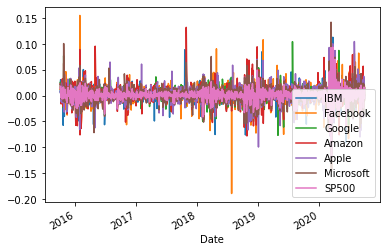

In [57]:
# Plotting the series to understand the correlation
returns.plot()

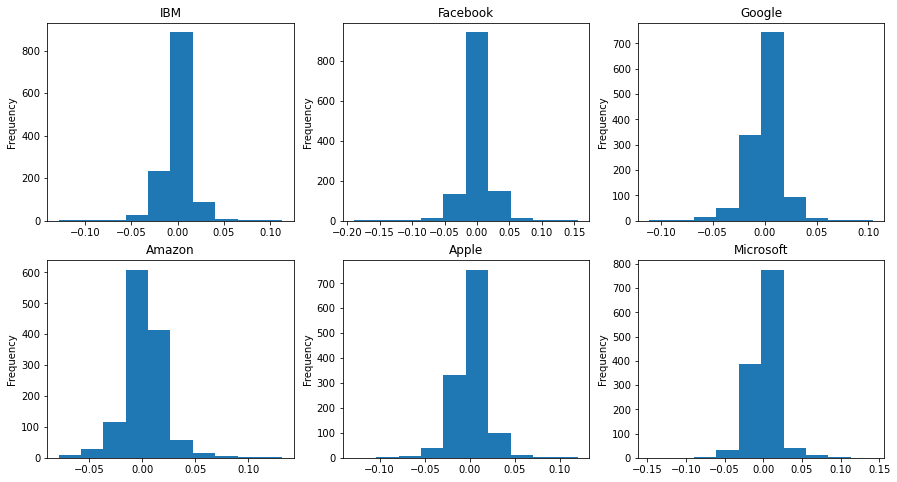

In [58]:
plt.figure(figsize=[15,8])
plt.subplot(2,3,1)
returns['IBM'].plot.hist()
plt.title('IBM')

plt.subplot(2,3,2)
returns['Facebook'].plot.hist()
plt.title('Facebook')

plt.subplot(2,3,3)
returns['Google'].plot.hist()
plt.title('Google')

plt.subplot(2,3,4)
returns['Amazon'].plot.hist()
plt.title('Amazon')

plt.subplot(2,3,5)
returns['Apple'].plot.hist()
plt.title('Apple')

plt.subplot(2,3,6)
returns['Microsoft'].plot.hist()
plt.title('Microsoft')
plt.show()

- Google and Amazon show high deviations from mean compared to other stocks

### Average daily return from each stock for the Technology Sector

In [59]:
daily_returns_mean = returns.mean()
print(daily_returns_mean)

IBM         -0.000002
Facebook     0.001050
Google       0.000834
Amazon       0.001611
Apple        0.001322
Microsoft    0.001387
SP500        0.000517
dtype: float64


In [60]:
## Average Daily Reeturns in percentage 
daily_returns_perc = returns.mean()*100
print(daily_returns_perc)

IBM         -0.000172
Facebook     0.104970
Google       0.083410
Amazon       0.161053
Apple        0.132215
Microsoft    0.138704
SP500        0.051749
dtype: float64


IBM shows negative daily returns hence it should not be considered for Investment purpose

### Cumulative Return in the Technology Sector if investor bought the stocks on 1st October 2015

In [61]:
new = returns.loc["2015-10-01":"2020-10-01", :]

# Cumulative return from the portfolio
cumulative_returns = (1+new).cumprod()
cumulative_returns.head(5)

,IBM,Facebook,Google,Amazon,Apple,Microsoft,SP500
Date,,,,,,,
2015-10-02,1.006895,1.012314,1.025553,1.022699,1.007301,1.021520,1.014315
2015-10-05,1.037955,1.033645,1.049371,1.044093,1.010951,1.045281,1.032867
2015-10-06,1.036145,1.020341,1.055866,1.032186,1.015788,1.047971,1.029161
2015-10-07,1.045268,1.015943,1.050827,1.040751,1.010951,1.049092,1.037431
2015-10-08,1.060520,1.016713,1.045592,1.023890,0.999270,1.063663,1.046579


### Risk of each stock

In [62]:
stock_risk = returns.std()
print(stock_risk)

IBM          0.016086
Facebook     0.020354
Google       0.016520
Amazon       0.018969
Apple        0.018729
Microsoft    0.017539
SP500        0.012080
dtype: float64


- Facebook shows the highest risk among all stocks

### Minimum and maximum of each stock

In [63]:
T_prices.min()

IBM            94.769997
Facebook       90.949997
Google        611.289978
Amazon        482.070007
Apple          22.584999
Microsoft      44.610001
SP500        1829.079956
dtype: float64

In [64]:
T_prices.max()

IBM           181.949997
Facebook      303.910004
Google       1728.280029
Amazon       3531.449951
Apple         134.179993
Microsoft     231.649994
SP500        3580.840088
dtype: float64

In [65]:
T_prices.count()

IBM          1259
Facebook     1259
Google       1259
Amazon       1259
Apple        1259
Microsoft    1259
SP500        1259
dtype: int64

## Healthcare Sector

In [66]:
Pharma = [MerckCO['Close'], Pfizer['Close'],RocheHolding['Close'] , UnitedHealthGroup['Close'], JohnsonJ['Close'], BauschHealth['Close'], SP500['Close']]
prices = reduce(lambda  left,right: pd.merge(left,right,on=['Date'],how='outer'), Pharma)
date_sorted = prices.sort_values(by='Date',ascending=True)
Ph_prices = date_sorted.loc['20151001':'20201001']
Ph_prices.columns = ['MerckCO','Pfizer','RocheHolding','UnitedHealthGroup','JohnsonJ','BauschHealth','SP500']
Ph_prices.dropna(inplace=True)

In [67]:
Ph_prices.head()

,MerckCO,Pfizer,RocheHolding,UnitedHealthGroup,JohnsonJ,BauschHealth,SP500
Date,,,,,,,
2015-10-01,49.369999,31.840000,33.220001,116.610001,93.169998,179.600006,1923.819946
2015-10-02,50.139999,33.080002,33.320000,118.830002,93.930000,182.320007,1951.359985
2015-10-05,51.230000,33.480000,33.439999,119.650002,94.760002,163.460007,1987.050049
2015-10-06,49.799999,32.790001,33.529999,116.050003,93.419998,166.000000,1979.920044
2015-10-07,50.950001,33.290001,32.549999,116.430000,94.980003,169.830002,1995.829956


### Comparing all stocks with S&P500 index in Healthcare Sector

In [68]:
fig = px.line(Ph_prices, x=Ph_prices.index ,y=['MerckCO','Pfizer','RocheHolding','UnitedHealthGroup','JohnsonJ','BauschHealth','SP500'])
fig.show()

United Health Group and Johnson and Johnson have performed better than other stocks in this sector

### Trend of Normalized Stocks in Healthcare Sector

In [69]:
Ph_prices.iloc[0]

MerckCO                49.369999
Pfizer                 31.840000
RocheHolding           33.220001
UnitedHealthGroup     116.610001
JohnsonJ               93.169998
BauschHealth          179.600006
SP500                1923.819946
Name: 2015-10-01 00:00:00, dtype: float64

In [70]:
Ph_normalized = Ph_prices.div(Ph_prices.iloc[0])
Ph_normalized.head()

,MerckCO,Pfizer,RocheHolding,UnitedHealthGroup,JohnsonJ,BauschHealth,SP500
Date,,,,,,,
2015-10-01,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
2015-10-02,1.015597,1.038945,1.003010,1.019038,1.008157,1.015145,1.014315
2015-10-05,1.037675,1.051508,1.006622,1.026070,1.017066,0.910134,1.032867
2015-10-06,1.008710,1.029837,1.009332,0.995198,1.002683,0.924276,1.029161
2015-10-07,1.032003,1.045540,0.979831,0.998456,1.019427,0.945601,1.037431


In [71]:
fig = px.line(Ph_normalized, x=Ph_normalized.index ,y=['MerckCO','Pfizer','RocheHolding','UnitedHealthGroup','JohnsonJ','BauschHealth','SP500'])
fig.show()

- Bausch Health has been on a decline since the beginning and doesnt show any signs of improvement hence it should not be considered for Investment purpose. 
- United health Group, MerckCo and Johnson&Johnson stock prices have increased after 1st oct 2015

### Strength Relative to S&P500 in Healthcare Sector

In [72]:
Ph_SP500 = Ph_prices.loc [:, ['MerckCO','Pfizer','RocheHolding','UnitedHealthGroup','JohnsonJ','BauschHealth']].apply(lambda x: x/Ph_prices['SP500'])
Ph_SP500.head()
#Av_prices.loc [:, ['AmericanAirlines','SouthwestAirlines','Allegiant','DeltaAirlines','AlaskaAirgroup','HawaiianHoldings']]

,MerckCO,Pfizer,RocheHolding,UnitedHealthGroup,JohnsonJ,BauschHealth
Date,,,,,,
2015-10-01,0.025662,0.016550,0.017268,0.060614,0.048430,0.093356
2015-10-02,0.025695,0.016952,0.017075,0.060896,0.048136,0.093432
2015-10-05,0.025782,0.016849,0.016829,0.060215,0.047689,0.082263
2015-10-06,0.025153,0.016561,0.016935,0.058613,0.047184,0.083842
2015-10-07,0.025528,0.016680,0.016309,0.058337,0.047589,0.085092


In [73]:
fig = px.line(Ph_SP500, x=Ph_SP500.index ,y=['MerckCO','Pfizer','RocheHolding','UnitedHealthGroup','JohnsonJ','BauschHealth'])
fig.show()

- United Heallth group performed better than S&P 500 index. 
- MerckCO has shown a trend similar to S&P500 index

### Calculating the daily returns in Healthcare Sector

In [74]:
returns = Ph_prices.pct_change(1)

# Dropping the rows with missing values
returns = returns.dropna(axis=0)
returns.head()

,MerckCO,Pfizer,RocheHolding,UnitedHealthGroup,JohnsonJ,BauschHealth,SP500
Date,,,,,,,
2015-10-02,0.015597,0.038945,0.003010,0.019038,0.008157,0.015145,0.014315
2015-10-05,0.021739,0.012092,0.003601,0.006901,0.008836,-0.103444,0.018290
2015-10-06,-0.027913,-0.020609,0.002691,-0.030088,-0.014141,0.015539,-0.003588
2015-10-07,0.023092,0.015249,-0.029228,0.003274,0.016699,0.023072,0.008036
2015-10-08,0.001374,-0.006008,0.021505,-0.003006,0.001053,0.007890,0.008818


<AxesSubplot:xlabel='Date'>

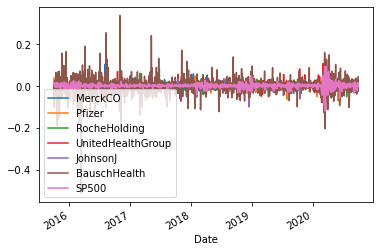

In [75]:
# Plotting the series to understand the correlation
returns.plot()

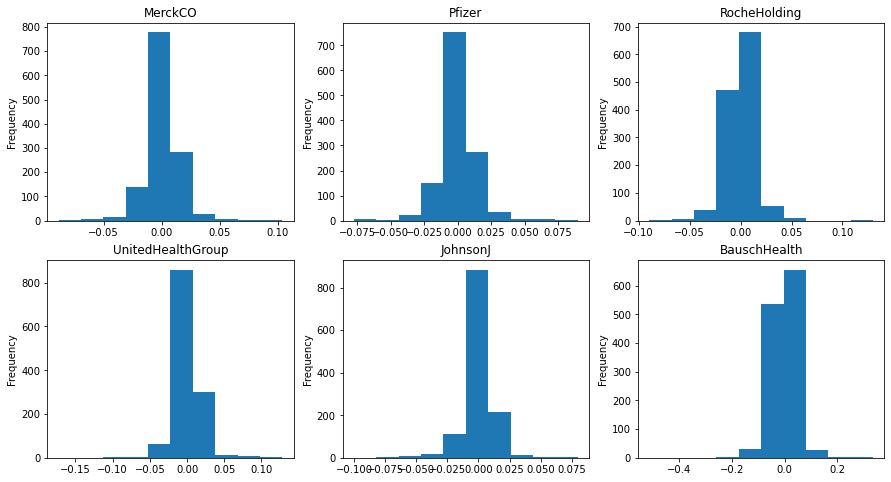

In [76]:
plt.figure(figsize=[15,8])
plt.subplot(2,3,1)
returns['MerckCO'].plot.hist()
plt.title('MerckCO')

plt.subplot(2,3,2)
returns['Pfizer'].plot.hist()
plt.title('Pfizer')

plt.subplot(2,3,3)
returns['RocheHolding'].plot.hist()
plt.title('RocheHolding')

plt.subplot(2,3,4)
returns['UnitedHealthGroup'].plot.hist()
plt.title('UnitedHealthGroup')

plt.subplot(2,3,5)
returns['JohnsonJ'].plot.hist()
plt.title('JohnsonJ')

plt.subplot(2,3,6)
returns['BauschHealth'].plot.hist()
plt.title('BauschHealth')
plt.show()

- Pfizer has shown greater deviation from mean compared to other stocks

### Average daily return from each stock in Healthcare Sector

In [77]:
daily_returns_mean = returns.mean()
print(daily_returns_mean)

MerckCO              0.000511
Pfizer               0.000209
RocheHolding         0.000293
UnitedHealthGroup    0.000941
JohnsonJ             0.000451
BauschHealth        -0.000897
SP500                0.000517
dtype: float64


- Bausch health is the only stock with negative returns
- United health group shows the highest daily returns 

In [78]:
## Average Daily Reeturns in percentage 
daily_returns_perc = returns.mean()*100
print(daily_returns_perc)

MerckCO              0.051124
Pfizer               0.020852
RocheHolding         0.029271
UnitedHealthGroup    0.094126
JohnsonJ             0.045050
BauschHealth        -0.089683
SP500                0.051749
dtype: float64


### Cumulative Return  in Healthcare Sector if investor bought the stocks on 1st October 2015

In [79]:
new = returns.loc["2015-09-30":"2020-10-01", :]

# Cumulative return from the portfolio
cumulative_returns = (1+new).cumprod()
cumulative_returns.head(5)

,MerckCO,Pfizer,RocheHolding,UnitedHealthGroup,JohnsonJ,BauschHealth,SP500
Date,,,,,,,
2015-10-02,1.015597,1.038945,1.003010,1.019038,1.008157,1.015145,1.014315
2015-10-05,1.037675,1.051508,1.006622,1.026070,1.017066,0.910134,1.032867
2015-10-06,1.008710,1.029837,1.009332,0.995198,1.002683,0.924276,1.029161
2015-10-07,1.032003,1.045540,0.979831,0.998456,1.019427,0.945601,1.037431
2015-10-08,1.033421,1.039259,1.000903,0.995455,1.020500,0.953062,1.046579


### Risk of each stock

In [80]:
stock_risk = returns.std()
print(stock_risk)

MerckCO              0.014067
Pfizer               0.013826
RocheHolding         0.013514
UnitedHealthGroup    0.017810
JohnsonJ             0.012459
BauschHealth         0.044551
SP500                0.012080
dtype: float64


- Even if United Health Group shows highest daily returns, it has high risk as well. 
- Hence this is more suitable for Peter than for Patrick

### Minimum and maximum of each stock

In [81]:
Ph_prices.min()

MerckCO                48.590000
Pfizer                 28.490000
RocheHolding           26.389999
UnitedHealthGroup     109.230003
JohnsonJ               93.169998
BauschHealth            8.510000
SP500                1829.079956
dtype: float64

In [82]:
Ph_prices.max()

MerckCO                92.040001
Pfizer                 46.230000
RocheHolding           46.840000
UnitedHealthGroup     323.700012
JohnsonJ              155.509995
BauschHealth          182.320007
SP500                3580.840088
dtype: float64

In [83]:
Ph_prices.count()

MerckCO              1259
Pfizer               1259
RocheHolding         1259
UnitedHealthGroup    1259
JohnsonJ             1259
BauschHealth         1259
SP500                1259
dtype: int64

## Combining the datasets together

In [84]:
Av= Av_prices.drop(['SP500'],axis='columns')
F = F_prices.drop(['SP500'],axis='columns')
T = T_prices.drop(['SP500'],axis='columns')
All = [Av, F,T,Ph_prices]
All_merged = reduce(lambda  left,right: pd.merge(left,right,on=['Date'],how='inner'), All)

All = All_merged.reset_index()
All.dropna(inplace=True)
All.head()

,Date,AmericanAirlines,SouthwestAirlines,Allegiant,DeltaAirlines,AlaskaAirgroup,HawaiianHoldings,Barclays,CreditSuisse,DeutscheBank,...,Amazon,Apple,Microsoft,MerckCO,Pfizer,RocheHolding,UnitedHealthGroup,JohnsonJ,BauschHealth,SP500
0,2015-10-01,39.200001,38.410000,217.979996,45.410000,80.230003,24.730000,15.01,24.090000,26.520000,...,520.719971,27.395000,44.610001,49.369999,31.840000,33.220001,116.610001,93.169998,179.600006,1923.819946
1,2015-10-02,38.630001,38.380001,215.589996,44.869999,79.260002,24.280001,15.39,24.639999,27.139999,...,532.539978,27.594999,45.570000,50.139999,33.080002,33.320000,118.830002,93.930000,182.320007,1951.359985
2,2015-10-05,40.189999,39.299999,216.059998,46.959999,80.910004,25.500000,15.60,25.160000,28.200001,...,543.679993,27.695000,46.630001,51.230000,33.480000,33.439999,119.650002,94.760002,163.460007,1987.050049
3,2015-10-06,38.130001,38.000000,208.600006,45.090000,74.529999,24.250000,15.55,25.379999,28.400000,...,537.479980,27.827499,46.750000,49.799999,32.790001,33.529999,116.050003,93.419998,166.000000,1979.920044
4,2015-10-07,39.310001,38.709999,213.839996,45.990002,75.970001,24.559999,15.73,25.320000,28.790001,...,541.940002,27.695000,46.799999,50.950001,33.290001,32.549999,116.430000,94.980003,169.830002,1995.829956


In [85]:
All_returns = All_merged.pct_change(1)
des_stats = All_returns.describe()
des_stats.drop(['25%','50%','75%'],axis=0,inplace=True)
des_stats
#index=index

,AmericanAirlines,SouthwestAirlines,Allegiant,DeltaAirlines,AlaskaAirgroup,HawaiianHoldings,Barclays,CreditSuisse,DeutscheBank,GoldmanSachs,...,Amazon,Apple,Microsoft,MerckCO,Pfizer,RocheHolding,UnitedHealthGroup,JohnsonJ,BauschHealth,SP500
count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,...,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000
mean,-0.000336,0.000245,-0.000047,0.000042,-0.000256,0.000034,-0.000548,-0.000437,-0.000529,0.000303,...,0.001611,0.001322,0.001387,0.000511,0.000209,0.000293,0.000941,0.000451,-0.000897,0.000517
std,0.034725,0.022913,0.029101,0.026478,0.026907,0.033132,0.025119,0.022842,0.027743,0.019899,...,0.018969,0.018729,0.017539,0.014067,0.013826,0.013514,0.017810,0.012459,0.044551,0.012080
min,-0.252246,-0.151094,-0.283300,-0.259924,-0.232385,-0.264971,-0.218519,-0.182598,-0.174888,-0.127053,...,-0.079221,-0.128647,-0.147390,-0.088990,-0.077346,-0.089609,-0.172769,-0.100379,-0.514629,-0.119841
max,0.410970,0.144441,0.292428,0.210171,0.203079,0.245837,0.151042,0.163447,0.140244,0.175803,...,0.132164,0.119808,0.142169,0.104080,0.089607,0.130118,0.127989,0.079977,0.337444,0.093828


In [86]:
des_stats.loc['Avg_Daily_Returns'] = des_stats.loc['mean']*100
des_stats.loc['Risk'] = des_stats.loc['std']*100
des_stats.loc['Annualized_Returns'] = 252*des_stats.loc['Avg_Daily_Returns']
des_stats.loc['Annualized_Risk'] = math.sqrt(252)*des_stats.loc['Risk']
cumulative_returns = pd.Series(All.iloc[-1,1:]/All.iloc[1,0:]-1)
des_stats = des_stats.append(cumulative_returns,ignore_index=True)
des_stats.loc['Sharp Ratio'] = (des_stats.iloc[7,:]-0.75)/des_stats.iloc[6,:]
des_stats.index = ['Count','Mean','std','min','max','Avg Daily Returns', 'Risk','Annualized Returns','Annualized Risk','Cumulative Returns','Sharp Ratio']
des_stats

,AmericanAirlines,SouthwestAirlines,Allegiant,DeltaAirlines,AlaskaAirgroup,HawaiianHoldings,Barclays,CreditSuisse,DeutscheBank,GoldmanSachs,...,Apple,Microsoft,MerckCO,Pfizer,RocheHolding,UnitedHealthGroup,JohnsonJ,BauschHealth,SP500,Date
Count,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,...,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,1258.000000,NaN
Mean,-0.000336,0.000245,-0.000047,0.000042,-0.000256,0.000034,-0.000548,-0.000437,-0.000529,0.000303,...,0.001322,0.001387,0.000511,0.000209,0.000293,0.000941,0.000451,-0.000897,0.000517,NaN
std,0.034725,0.022913,0.029101,0.026478,0.026907,0.033132,0.025119,0.022842,0.027743,0.019899,...,0.018729,0.017539,0.014067,0.013826,0.013514,0.017810,0.012459,0.044551,0.012080,NaN
min,-0.252246,-0.151094,-0.283300,-0.259924,-0.232385,-0.264971,-0.218519,-0.182598,-0.174888,-0.127053,...,-0.128647,-0.147390,-0.088990,-0.077346,-0.089609,-0.172769,-0.100379,-0.514629,-0.119841,NaN
max,0.410970,0.144441,0.292428,0.210171,0.203079,0.245837,0.151042,0.163447,0.140244,0.175803,...,0.119808,0.142169,0.104080,0.089607,0.130118,0.127989,0.079977,0.337444,0.093828,NaN
Avg Daily Returns,-0.033611,0.024460,-0.004708,0.004181,-0.025574,0.003424,-0.054837,-0.043672,-0.052886,0.030334,...,0.132215,0.138704,0.051124,0.020852,0.029271,0.094126,0.045050,-0.089683,0.051749,NaN
Risk,3.472483,2.291330,2.910086,2.647807,2.690691,3.313174,2.511873,2.284161,2.774288,1.989900,...,1.872922,1.753947,1.406695,1.382614,1.351412,1.781039,1.245905,4.455074,1.208006,NaN
Annualized Returns,-8.470057,6.163837,-1.186343,1.053570,-6.444588,0.862866,-13.819019,-11.005358,-13.327353,7.644200,...,33.318190,34.953498,12.883185,5.254808,7.376346,23.719727,11.352656,-22.600018,13.040656,NaN
Annualized Risk,55.123957,36.373735,46.196183,42.032636,42.713402,52.595001,39.874742,36.259932,44.040452,31.588685,...,29.731721,27.843048,22.330584,21.948310,21.452996,28.273114,19.778133,70.722113,19.176501,NaN
Cumulative Returns,-0.681853,-0.022929,-0.444316,-0.318476,-0.537850,-0.469110,-0.674464,-0.595373,-0.690494,0.135360,...,3.196775,3.615537,0.654368,0.109432,0.284814,1.623664,0.585010,-0.914765,0.723413,NaN


```Inferences```
- In the Aviation Sector, all companies have negative Cumulative returns so Investing in Aviation sector most pandemic can prove to be a risky decision. 
- In the Finance Industry , Goldman sach and Morgan stanley are the only companies with positive Cumulative Returns. However the risk percentage for Morgan Stanley is higher than Goldman Sach. 
- In the Technology Setor, IBM faced negative cumulative returns, whereas all other companies have positive cumulative returns. Among them, Amazon has the highest Sharp ratio.
- In the healthcare sector, BauschHealth has negative returns. United Health Group has highest sharp Ratio.

In [87]:
des_stats.to_csv('Descriptive_statistics.csv')

In [88]:
All_corr = All_returns.corr()


<AxesSubplot:>

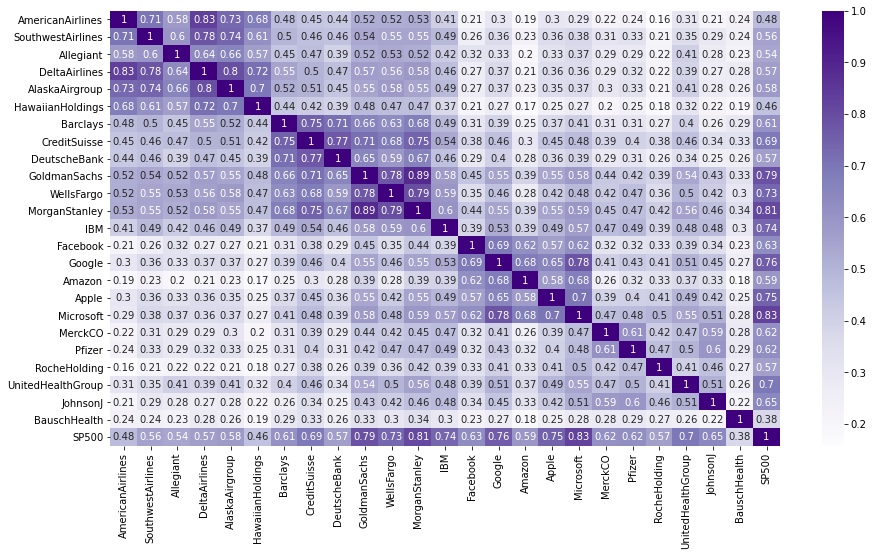

In [89]:
plt.figure(figsize=[15,8])
sns.heatmap(All_corr, cmap='Purples',annot=True)

- Goldman Sachs , Morgan stanley, Google, Wells Fargo , Microsoft , Apple have a high correlation with S&P500 
- The genral trend in the above graph shows that all companies from technology sector are correlated with each other. 
- Aviation sector too shows high correlation with each other. 

In [90]:
writer = pd.ExcelWriter("Investment_companies_cleaned.xlsx",
                        engine='xlsxwriter',
                        datetime_format='d-m-yyyy',
                        date_format='mmmm dd yyyy')
All.to_excel(writer, sheet_name='Closing_Prices')
workbook  = writer.book
worksheet = writer.sheets['Closing_Prices']

worksheet.set_column('B:C', 15)

# Close the Pandas Excel writer and output the Excel file.
writer.save()

# Evaluating our Portfolio

In [91]:
portfolio = pd.read_excel("Investment_companies_cleaned.xlsx", usecols="B:AA")
portfolio = portfolio.set_index('Date')
portfolio.head()

,AmericanAirlines,SouthwestAirlines,Allegiant,DeltaAirlines,AlaskaAirgroup,HawaiianHoldings,Barclays,CreditSuisse,DeutscheBank,GoldmanSachs,...,Amazon,Apple,Microsoft,MerckCO,Pfizer,RocheHolding,UnitedHealthGroup,JohnsonJ,BauschHealth,SP500
Date,,,,,,,,,,,,,,,,,,,,,
2015-10-01,39.200001,38.410000,217.979996,45.410000,80.230003,24.730000,15.01,24.090000,26.520000,176.020004,...,520.719971,27.395000,44.610001,49.369999,31.840000,33.220001,116.610001,93.169998,179.600006,1923.819946
2015-10-02,38.630001,38.380001,215.589996,44.869999,79.260002,24.280001,15.39,24.639999,27.139999,177.009995,...,532.539978,27.594999,45.570000,50.139999,33.080002,33.320000,118.830002,93.930000,182.320007,1951.359985
2015-10-05,40.189999,39.299999,216.059998,46.959999,80.910004,25.500000,15.60,25.160000,28.200001,180.699997,...,543.679993,27.695000,46.630001,51.230000,33.480000,33.439999,119.650002,94.760002,163.460007,1987.050049
2015-10-06,38.130001,38.000000,208.600006,45.090000,74.529999,24.250000,15.55,25.379999,28.400000,180.320007,...,537.479980,27.827499,46.750000,49.799999,32.790001,33.529999,116.050003,93.419998,166.000000,1979.920044
2015-10-07,39.310001,38.709999,213.839996,45.990002,75.970001,24.559999,15.73,25.320000,28.790001,182.229996,...,541.940002,27.695000,46.799999,50.950001,33.290001,32.549999,116.430000,94.980003,169.830002,1995.829956


# Portfolio for Patrick Iyengar 

### Initial weight for each stock in order

In [92]:
Patrick_stocks = portfolio[['JohnsonJ','Microsoft','GoldmanSachs']]
Pat_weight = np.array([0.33, 0.33, 0.33])

### Daily return from each stock

In [93]:
return_stocks = Patrick_stocks.pct_change()
return_stocks.head(5)

,JohnsonJ,Microsoft,GoldmanSachs
Date,,,
2015-10-01,NaN,NaN,NaN
2015-10-02,0.008157,0.021520,0.005624
2015-10-05,0.008836,0.023261,0.020846
2015-10-06,-0.014141,0.002573,-0.002103
2015-10-07,0.016699,0.001069,0.010592


In [94]:
stock_risk = return_stocks.std()
print(stock_risk)

JohnsonJ        0.012459
Microsoft       0.017539
GoldmanSachs    0.019899
dtype: float64


### Average daily return from each stock

In [95]:
# Average daily return from each stock
daily_returns_mean = return_stocks.mean()
print(daily_returns_mean)

JohnsonJ        0.000451
Microsoft       0.001387
GoldmanSachs    0.000303
dtype: float64


Microsoft seems to be the best performer.

### Total Portfolio Return

In [96]:
# Answer here
allocated_daily_return = (Pat_weight*daily_returns_mean)
# Total Portfolio Return - Store the reults in "portfolio_return"
portfolio_return = np.sum(allocated_daily_return)
portfolio_return

0.0007064927309941623

### Daily return from the portfolio

In [97]:
# Portfolio daily returns
return_stocks['Portfolio_Daily_Return'] = return_stocks.dot(Pat_weight)
return_stocks.tail(5)

,JohnsonJ,Microsoft,GoldmanSachs,Portfolio_Daily_Return
Date,,,,
2020-09-24,0.001592,0.012962,0.048302,0.020743
2020-09-25,0.006843,0.022787,-0.000820,0.009507
2020-09-28,0.009955,0.007795,0.021134,0.012832
2020-09-29,-0.000340,-0.010409,-0.011453,-0.007327
2020-09-30,0.012376,0.014812,0.021241,0.015982


<AxesSubplot:xlabel='Date'>

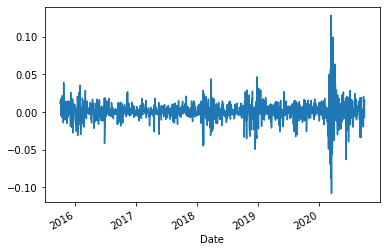

In [98]:
# Plot
return_stocks['Portfolio_Daily_Return'].plot()

### Cumulative return from the Portfolio

In [99]:
# Cumulative return from the portfolio
Cumulative_returns_daily = (1+return_stocks).cumprod()
Cumulative_returns_daily.tail(5)

,JohnsonJ,Microsoft,GoldmanSachs,Portfolio_Daily_Return
Date,,,,
2020-09-24,1.552753,4.554808,1.108454,2.098639
2020-09-25,1.563379,4.658597,1.107545,2.118591
2020-09-28,1.578942,4.694911,1.130951,2.145776
2020-09-29,1.578405,4.646043,1.117998,2.130055
2020-09-30,1.597939,4.714862,1.141745,2.164096


In [100]:
Cumulative_returns_daily.sum()

JohnsonJ                  1742.857825
Microsoft                 2882.905340
GoldmanSachs              1482.736246
Portfolio_Daily_Return    1962.131784
dtype: float64

<AxesSubplot:xlabel='Date'>

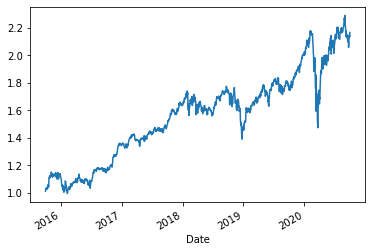

In [101]:
Cumulative_returns_daily['Portfolio_Daily_Return'].plot()

In [102]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.
covariance_portfolio = return_stocks.iloc[:,:-1]
covariance_portfolio = (covariance_portfolio.cov())*252

covariance_portfolio

,JohnsonJ,Microsoft,GoldmanSachs
JohnsonJ,0.039117,0.028277,0.026971
Microsoft,0.028277,0.077524,0.050981
GoldmanSachs,0.026971,0.050981,0.099785


In [103]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(Pat_weight.T,np.dot(covariance_portfolio, Pat_weight))

In [104]:
# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk

0.2161142411750849

Our portfolio shows Risk of 21% in total which is close to the SP500 risk of 19%

### Sharpe Ratio

In [105]:
# Assuming that the risk free rate is 75%
Sharpe_Ratio = (252*return_stocks['Portfolio_Daily_Return'].mean()-0.0075) / return_stocks['Portfolio_Daily_Return'].std()
Sharpe_Ratio

12.526605044821686

In [106]:
Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
Annualised_Sharpe_Ratio

198.85369032315174

# Portfolio of Peter Iyengar

### Initial weight for each stock in order

In [107]:
Peter_stocks = portfolio[['MorganStanley','Amazon','UnitedHealthGroup']]
Pet_weight = np.array([0.33, 0.33, 0.33])

### Daily return from each stock

In [108]:
return_stocks = Peter_stocks.pct_change()
return_stocks.head(5)

,MorganStanley,Amazon,UnitedHealthGroup
Date,,,
2015-10-01,NaN,NaN,NaN
2015-10-02,-0.002222,0.022699,0.019038
2015-10-05,0.027362,0.020919,0.006901
2015-10-06,0.002168,-0.011404,-0.030088
2015-10-07,0.017614,0.008298,0.003274


In [109]:
stock_risk = return_stocks.std()
print(stock_risk)

MorganStanley        0.021810
Amazon               0.018969
UnitedHealthGroup    0.017810
dtype: float64


### Average daily return from each stock

In [110]:
# Average daily return from each stock
daily_returns_mean = return_stocks.mean()
print(daily_returns_mean)

MorganStanley        0.000578
Amazon               0.001611
UnitedHealthGroup    0.000941
dtype: float64


Amazon seems to be the best performer.

### Total Portfolio Return

In [111]:

allocated_daily_return = (Pet_weight*daily_returns_mean)
# Total Portfolio Return - Store the reults in "portfolio_return"
portfolio_return = np.sum(allocated_daily_return)
portfolio_return

0.0010326747259511413

### Daily return from the portfolio

In [112]:
# Portfolio daily returns
return_stocks['Portfolio_Daily_Return'] = return_stocks.dot(Pet_weight)
return_stocks.tail(5)

,MorganStanley,Amazon,UnitedHealthGroup,Portfolio_Daily_Return
Date,,,,
2020-09-24,0.004093,0.006644,0.001780,0.004131
2020-09-25,0.009225,0.024949,0.033623,0.022373
2020-09-28,0.028486,0.025498,0.002413,0.018611
2020-09-29,-0.023563,-0.009190,0.003034,-0.009807
2020-09-30,0.023497,0.001224,0.025053,0.016426


<AxesSubplot:xlabel='Date'>

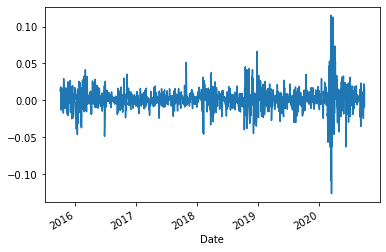

In [113]:
# Plot
return_stocks['Portfolio_Daily_Return'].plot()

### Cumulative return from the Portfolio

In [114]:
# Cumulative return from the portfolio
Cumulative_returns_daily = (1+return_stocks).cumprod()
Cumulative_returns_daily.tail(5)

,MorganStanley,Amazon,UnitedHealthGroup,Portfolio_Daily_Return
Date,,,,
2020-09-24,1.479683,5.799259,2.509733,3.015483
2020-09-25,1.493333,5.943943,2.594117,3.082948
2020-09-28,1.535873,6.095503,2.600377,3.140326
2020-09-29,1.499683,6.039484,2.608267,3.109527
2020-09-30,1.534921,6.046878,2.673613,3.160603


In [115]:
Cumulative_returns_daily.sum()

MorganStanley             1703.811748
Amazon                    3449.186857
UnitedHealthGroup         2300.042771
Portfolio_Daily_Return    2443.278793
dtype: float64

<AxesSubplot:xlabel='Date'>

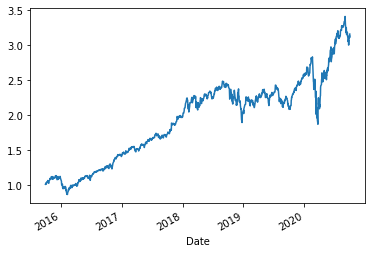

In [116]:
Cumulative_returns_daily['Portfolio_Daily_Return'].plot()

In [117]:
# Covariance matrix for the portfolio

# Removing the last column (Portfolio_Daily_Return) from our calculation.
covariance_portfolio = return_stocks.iloc[:,:-1]
covariance_portfolio = (covariance_portfolio.cov())*252

covariance_portfolio

,MorganStanley,Amazon,UnitedHealthGroup
MorganStanley,0.119865,0.040295,0.054676
Amazon,0.040295,0.090671,0.031256
UnitedHealthGroup,0.054676,0.031256,0.079937


In [118]:
# Applying the matrix operations mentioned in the image above
portfolio_variance = np.dot(Pet_weight.T,np.dot(covariance_portfolio, Pet_weight))

In [119]:
# Standard deviation (risk of portfolio)
portfolio_risk = np.sqrt(portfolio_variance)
portfolio_risk

0.24315585485608368

### Sharpe Ratio

In [120]:
# Assuming that the risk free rate is zero
Sharpe_Ratio = (252*return_stocks['Portfolio_Daily_Return'].mean()-0.0075) / return_stocks['Portfolio_Daily_Return'].std()
Sharpe_Ratio

16.499822159867367

In [121]:
Annualised_Sharpe_Ratio = (252**0.5)*Sharpe_Ratio
Annualised_Sharpe_Ratio

261.92655667081004